# Solar Wind Heliospheric Analysis (SWHA) — Helios 2
**Organised, deduplicated, publication-ready notebook.**

---

## Table of Contents

1. [Theory & Symbolic Work](#theory)
   - 1.1 Maxwell-Boltzmann Distributions (1D & 3D)
   - 1.2 Derivation of Moments & Kinetic Equation
   - 1.3 Physical Meaning of Distribution Moments
   - 1.4 Distribution Function Reference Tables
2. [Distribution Fitting & Moment Generation](#fitting)
   - 2.1 Helios 2 Single Snapshot VDF
   - 2.2 Curve Fitting: Gaussian, Maxwellian, Bi-Maxwellian, Kappa, Bi-Kappa
   - 2.3 Proton & Alpha Moment Calculations
3. [Exploratory Data Analysis & Statistics](#eda)
   - 3.1 Dataset Overview
   - 3.2 Derived Plasma Quantities
   - 3.3 Radial Profile Visualisation
4. [Poly Curve Fitting, Moving Average & Coefficient Extraction](#radial)
   - 4.1 Moving Average Smoothing
   - 4.2 Radial Power-Law Fits
   - 4.3 Power-Law Coefficient Summary
5. [Anisotropy & Directional Dependence](#anisotropy)
6. [Parker Spiral](#parker)
7. [Discussion & References](#discussion)


In [19]:
# ── Scientific plot style ──────────────────────────────────────────────────────
import matplotlib as mpl
import matplotlib.pyplot as plt

try:
    import scienceplots
    plt.style.use(['science', 'grid'])
except ImportError:
    plt.style.use('seaborn-v0_8-whitegrid')

# Global RC parameters for publication-quality figures
mpl.rcParams.update({
    'figure.dpi':        150,
    'savefig.dpi':       300,
    'figure.figsize':    (6, 4),
    'font.size':         11,
    'axes.labelsize':    12,
    'axes.titlesize':    13,
    'legend.fontsize':   10,
    'xtick.labelsize':   10,
    'ytick.labelsize':   10,
    'lines.linewidth':   1.5,
    'axes.linewidth':    1.0,
    'axes.grid':         True,
    'grid.alpha':        0.4,
    'savefig.bbox':      'tight',
})

# Colour cycle consistent with scientific journals
COLORS = ['#1f77b4','#d62728','#2ca02c','#ff7f0e','#9467bd','#8c564b']
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=COLORS)
print("Plot style configured.")


Plot style configured.


In [20]:
# ── Master Imports ─────────────────────────────────────────────────────────────
import numpy as np
import pandas as pd
import sympy as sp
import scipy as sc
import scipy.constants as const
from scipy.constants import m_p, k as kB, e, pi
from scipy.signal import argrelextrema
from scipy.optimize import curve_fit
from scipy.special import gamma
from scipy.integrate import quad, trapezoid
from sympy import symbols, Symbol, Eq, latex, exp, sqrt, integrate, oo, simplify, pi as spi

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib import cm
from matplotlib.ticker import FormatStrFormatter
from matplotlib.lines import Line2D
from matplotlib.animation import FuncAnimation, PillowWriter
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from IPython.display import display, Math

# ── Physical Constants ─────────────────────────────────────────────────────────
m_p_val   = 1.6726e-27          # kg  — proton mass
kB_val    = 1.3807e-23          # J/K — Boltzmann constant
m_alpha   = 4 * m_p_val         # kg  — alpha particle mass
mu0       = 4 * np.pi * 1e-7    # H/m — permeability of free space
nT_to_T   = 1e-9                # conversion factor nT → T
cm3_to_m3 = 1e6                 # conversion factor cm⁻³ → m⁻³
gamma_ad  = 5 / 3               # adiabatic index (monoatomic)
AU        = 1.496e11            # m   — astronomical unit
OMEGA_SUN = 2.865e-6            # rad/s — solar rotation rate


<a id="theory"></a>
# 1. Theory & Symbolic Work

## 1.1 Maxwell-Boltzmann Distributions (1D & 3D)

### 1D Velocity Distribution

$$
g(v_z)\,dv_z = n \left(\frac{m}{2\pi kT}\right)^{1/2}
\exp\!\left(-\frac{mv_z^2}{2kT}\right)dv_z
$$

Describes the probability density of particle velocities along a single axis at
thermal equilibrium.

### 3D Speed Distribution

$$
F(v)\,dv = 4\pi n\left(\frac{m}{2\pi kT}\right)^{3/2}
v^2 \exp\!\left(-\frac{mv^2}{2kT}\right)dv
$$

Gives the number of particles per unit volume with speeds between $v$ and $v+dv$.

**Key characteristic speeds** (let $a = \sqrt{2k_BT/m}$):

| Speed | Formula |
|-------|---------|
| Most probable | $v_\text{mp} = \sqrt{2k_BT/m}$ |
| Mean | $\langle v\rangle = \sqrt{8k_BT/(\pi m)}$ |
| RMS | $v_\text{rms} = \sqrt{3k_BT/m}$ |


In [21]:
# ── Symbolic definitions (SymPy) ───────────────────────────────────────────────
v_z = sp.symbols('v_z', real=True)
v, m, k, T, n = sp.symbols('v m k T n', positive=True)

# 1D Maxwell-Boltzmann
g_vz_sym = n * sp.sqrt(m / (2 * spi * k * T)) * sp.exp(-m * v_z**2 / (2 * k * T))

# 3D Maxwell-Boltzmann
F_v_sym = (4 * spi * n * (m / (2 * spi * k * T))**sp.Rational(3, 2)
           * v**2 * sp.exp(-m * v**2 / (2 * k * T)))

display(Math(r'g(v_z) = ' + sp.latex(g_vz_sym)))
display(Math(r'F(v)   = ' + sp.latex(F_v_sym)))


<IPython.core.display.Math object>

<IPython.core.display.Math object>

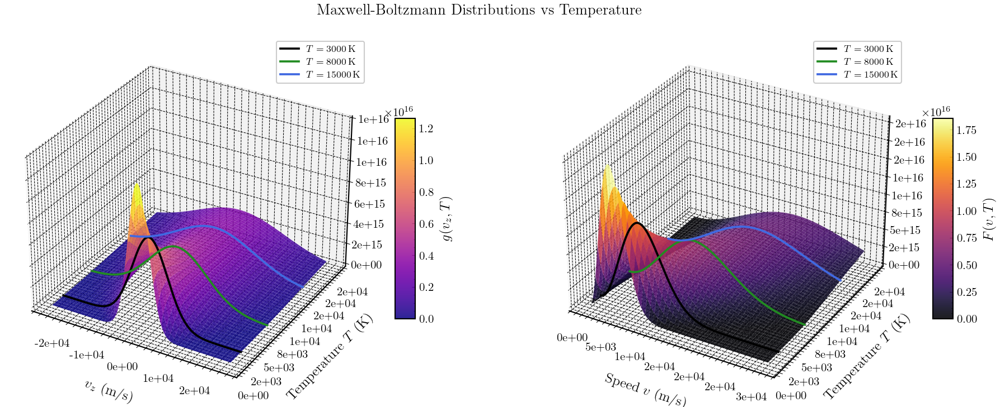

In [22]:
# ── Numerical evaluation of g(vz, T) ──────────────────────────────────────────
def g_vz_num(vz, T_arr, n_val, m_val):
    coeff = n_val * np.sqrt(m_val / (2 * const.pi * const.k * T_arr))[:, None]
    expo  = -m_val * vz[None, :]**2 / (2 * const.k * T_arr[:, None])
    return coeff * np.exp(expo)

def F_v_num(v_arr, T_arr, n_val, m_val):
    coeff = (m_val / (2 * const.pi * const.k * T_arr))**1.5
    expo  = -m_val * v_arr[None, :]**2 / (2 * const.k * T_arr[:, None])
    return 4 * const.pi * n_val * coeff[:, None] * v_arr[None, :]**2 * np.exp(expo)

n_val, m_val = 1e20, 1.67e-27
vz     = np.linspace(-2.5e4, 2.5e4, 300)
v_sp   = np.linspace(0, 3e4, 300)
T_vals = np.linspace(1e3, 2e4, 100)

G = g_vz_num(vz, T_vals, n_val, m_val)
F = F_v_num(v_sp, T_vals, n_val, m_val)
VZ, TT = np.meshgrid(vz, T_vals)
VS, TS = np.meshgrid(v_sp, T_vals)

# ── Figure: side-by-side 3-D surface plots ────────────────────────────────────
fig = plt.figure(figsize=(13, 5))

selected_T  = [3000, 8000, 15000]
slice_colors = ['k', 'forestgreen', 'royalblue']

for col, (data, XV, label, cmap_name, xlabel) in enumerate([
        (G, (VZ, TT), r'$g(v_z, T)$', 'plasma',  r'$v_z$ (m/s)'),
        (F, (VS, TS), r'$F(v, T)$',   'inferno', r'Speed $v$ (m/s)')
], start=1):
    ax = fig.add_subplot(1, 2, col, projection='3d')
    surf = ax.plot_surface(*XV, data, cmap=cmap_name, alpha=0.88, edgecolor='none')
    for T_sel, col_sl in zip(selected_T, slice_colors):
        idx = np.abs(T_vals - T_sel).argmin()
        x_sl = VZ[idx] if col == 1 else VS[idx]
        ax.plot(x_sl, [T_vals[idx]]*len(x_sl), data[idx],
                color=col_sl, lw=1.8, label=rf'$T={T_sel}\,$K')
    ax.set_xlabel(xlabel, labelpad=8)
    ax.set_ylabel(r'Temperature $T$ (K)', labelpad=8)
    ax.set_zlabel(label, labelpad=8)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.0e'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.0e'))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.0e'))
    fig.colorbar(surf, ax=ax, shrink=0.55, aspect=10, label=label)
    ax.legend(fontsize=8, loc='upper right')

fig.suptitle('Maxwell-Boltzmann Distributions vs Temperature', fontsize=13)
plt.tight_layout()
plt.savefig('figures/maxwell_boltzmann_distributions.pdf')
plt.show()


## 1.2 Kinetic Equation & Conservation Laws

Since the total number of particles is conserved, $D_t N = 0$, giving:

$$
D_t f = \partial_t f + \dot{x}\,\partial_x f + \ddot{x}\,\partial_{\dot{x}} f = 0
$$

**Zeroth moment** — Continuity equation:

$$
\frac{\partial n}{\partial t} + \nabla_x \cdot (n\langle v\rangle) = 0
$$

where $n(x,t) = \int f\,dv$ and $\langle v\rangle = n^{-1}\int v f\,dv$.


In [23]:
# ── Symbolic kinetic equation (SymPy) ─────────────────────────────────────────
t, x_sym, v_sym = sp.symbols('t x v', real=True)
f_sym = sp.Function('f')(x_sym, v_sym, t)

# Total time derivative (collisionless, 1D, no acceleration)
Dt_f    = sp.diff(f_sym, t) + v_sym * sp.diff(f_sym, x_sym)
moment0 = sp.integrate(Dt_f, (v_sym, -sp.oo, sp.oo))

display(Math(r'D_t f = ' + sp.latex(Dt_f)))
display(Math(r'\int D_t f\,dv = ' + sp.latex(moment0)))


<IPython.core.display.Math object>

<IPython.core.display.Math object>

## 1.3 Physical Meaning of Distribution Moments

Given a 1D velocity distribution $f(v)$, the **$n$-th central moment** is:

$$
M_n = \frac{1}{n}\int (v - \langle v\rangle)^n f(v)\,dv
$$

| Moment | Expression | Physical Quantity |
|--------|-----------|-------------------|
| **0th** | $n = \int f(v)\,dv$ | Number density (particles/m³) |
| **1st** | $\langle v\rangle = n^{-1}\int v f\,dv$ | Bulk velocity (m/s) |
| **2nd** | $n^{-1}\int(v-\langle v\rangle)^2 f\,dv$ | Variance → temperature/pressure |
| **3rd** | $n^{-1}\int(v-\langle v\rangle)^3 f\,dv$ | Skewness — distribution asymmetry |
| **4th** | $n^{-1}\int(v-\langle v\rangle)^4 f\,dv$ | Kurtosis — peak/tail behaviour |

Pressure relations:

$$
P_{\rm 1D} = m\int(v-\langle v\rangle)^2 f\,dv, \qquad
P_{\rm 3D} = \tfrac{1}{3}m\int(v-\langle v\rangle)^2 f\,dv
$$

**Heat flux** (collisionless plasma):

$$
q = \tfrac{1}{2}m\int(v-u)^3 f(v)\,dv
$$

Standard deviation: $\sigma = \sqrt{n^{-1}\int(v-u)^2 f\,dv}$, 
related to temperature via $T = m\sigma^2/k_B$.


In [24]:
# ── Symbolic central moments of the 1D Maxwell-Boltzmann ─────────────────────
v_s, m_s, k_s, T_s, n_s = symbols('v m k T n', real=True, positive=True)

gv_sym = n_s * sqrt(m_s / (2 * spi * k_s * T_s)) * exp(-m_s * v_s**2 / (2 * k_s * T_s))
mean_v = simplify(integrate(v_s * gv_sym, (v_s, -oo, oo)) / n_s)

for i in range(5):
    centre = mean_v if i > 0 else sp.Integer(0)
    Mi = simplify(integrate((v_s - centre)**i * gv_sym, (v_s, -oo, oo))
                  / (n_s if i > 0 else 1))
    display(Math(f'M_{i} = ' + sp.latex(Mi)))


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

## 1.4 Distribution Function Reference

### Bi-Maxwellian

$$
f(v_\parallel, v_\perp) = n
\left(\frac{m}{2\pi k_B T_\perp}\right)
\left(\frac{m}{2\pi k_B T_\parallel}\right)^{1/2}
\exp\!\left(-\frac{mv_\perp^2}{2k_BT_\perp} - \frac{mv_\parallel^2}{2k_BT_\parallel}\right)
$$

Used in anisotropic plasmas. Drives the **firehose** ($T_\parallel>T_\perp$) and
**mirror** ($T_\perp>T_\parallel$) instabilities.

### Kappa Distribution

$$
f_\kappa(v) = \frac{n}{\pi^{3/2}\theta^3}
\cdot\frac{\Gamma(\kappa+1)}{\kappa^{3/2}\,\Gamma(\kappa-\tfrac{1}{2})}
\left(1+\frac{v^2}{\kappa\theta^2}\right)^{-(\kappa+1)}
$$

As $\kappa\to\infty$, recovers the Maxwellian. Models suprathermal tails
from wave–particle interactions or turbulence.

### Diagnostic Summary

| Quantity | Formula | Use |
|----------|---------|-----|
| Maxwellian $T$ fit | $A\exp[{-m(v-u)^2/(2k_BT)}]$ | Extract $T$ at equilibrium |
| Tail index | $f(v)\propto v^{-\alpha}$ | Suprathermal tail strength |
| KL divergence | $\int f\ln(f/f_M)\,dv$ | Non-thermal deviation |


<a id="fitting"></a>
# 2. Distribution Fitting & Moment Generation

## 2.1 Helios 2 Single Snapshot VDF (9 Feb 1976, 00:35:05)

Data from the E1 plasma instrument — 32 energy channels.


In [25]:
# === Helios 2 — Single Snapshot VDF (Feb 9 1976, 00:35:05) ===
# 32 energy channels from the E1 plasma instrument

v_arr = np.array([
     178.1586,   191.43102,  205.60291,  221.15424,  237.81458,  254.80132,
     274.95465,  295.68668,  317.56601,  341.42957,  366.89032,  394.73651,
     424.32901,  455.32739,  491.44302,  528.64026,  568.48553,  611.16919,
     657.01642,  707.24902,  760.2403,   815.80646,  880.4483,   947.23059,
    1019.8422,  1096.6,     1178.5919,  1268.673,   1363.6038,  1463.2292,
    1578.946,   1698.548
])  # km/s

f_arr = np.array([
    0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
    0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
    0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
    0.0000000e+00, 2.6393590e-19, 2.9115522e-18, 1.7339317e-17, 3.5426939e-17,
    1.7673032e-17, 1.8904058e-18, 1.9256069e-19, 5.7039686e-19, 4.7156246e-19,
    1.5959650e-19, 3.0702970e-20, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
    0.0000000e+00, 7.3913145e-21
])  # cm⁻⁶ s³

f_arr_clipped = np.clip(f_arr, 1e-20, None)
print('VDF data loaded. Shape:', v_arr.shape)

VDF data loaded. Shape: (32,)


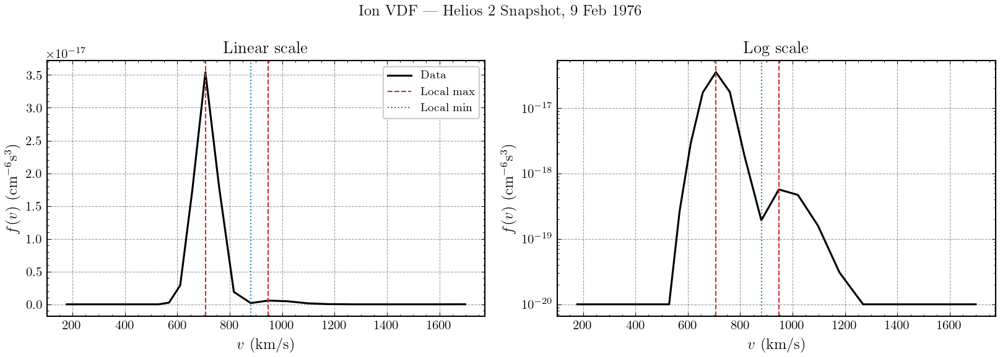

In [26]:
# ── Find local extrema ────────────────────────────────────────────────────────
max_indices = argrelextrema(f_arr, np.greater)[0]
min_indices = argrelextrema(f_arr, np.less)[0]

f_arr_clipped = np.clip(f_arr, 1e-20, None)

# ── Figure: linear and log-scale VDF with extrema ────────────────────────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4), sharex=True)

for ax, yscale in zip([ax1, ax2], ['linear', 'log']):
    ydata = f_arr if yscale == 'linear' else f_arr_clipped
    ax.plot(v_arr, ydata, color='k', lw=1.5, label='Data')
    for i in max_indices:
        ax.axvline(v_arr[i], color='C1', ls='--', lw=1,
                   label='Local max' if i == max_indices[0] else '')
    for i in min_indices:
        ax.axvline(v_arr[i], color='C0', ls=':', lw=1,
                   label='Local min' if i == min_indices[0] else '')
    if yscale == 'log':
        ax.set_yscale('log')
    ax.set_xlabel(r'$v$ (km/s)')
    ax.set_ylabel(r'$f(v)$ (cm$^{-6}$s$^3$)')

ax1.set_title('Linear scale')
ax2.set_title('Log scale')
ax1.legend(fontsize=9)
fig.suptitle('Ion VDF — Helios 2 Snapshot, 9 Feb 1976', fontsize=12)
plt.tight_layout()
plt.savefig('figures/vdf_snapshot.pdf')
plt.show()


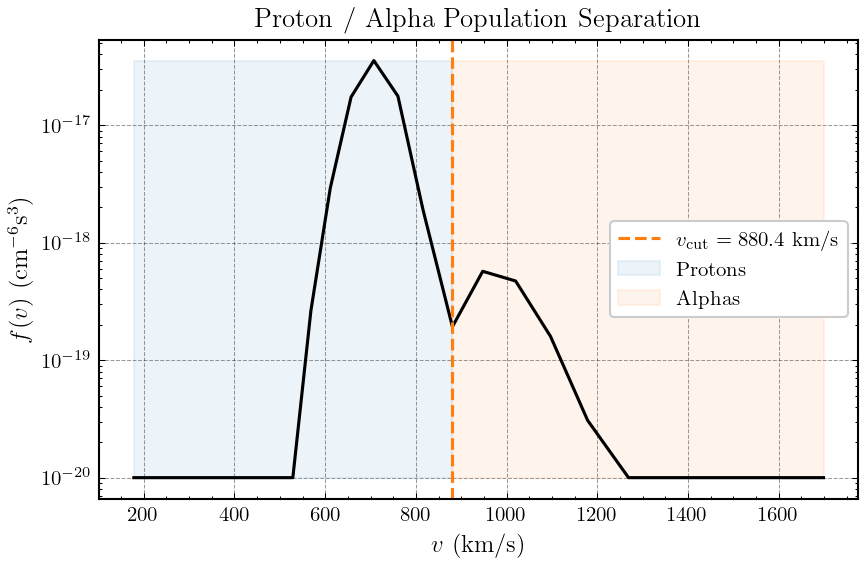

In [27]:
# ── Proton / Alpha population cut ─────────────────────────────────────────────
CUT   = 22
v_cut = v_arr[CUT]

fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(v_arr, f_arr_clipped, color='k', lw=1.5)
ax.axvline(v_cut, color='C3', ls='--', lw=1.5, label=rf'$v_\mathrm{{cut}}={v_cut:.1f}$ km/s')
ax.fill_betweenx([f_arr_clipped.min(), f_arr_clipped.max()],
                 v_arr[0], v_cut, alpha=0.08, color='C0', label='Protons')
ax.fill_betweenx([f_arr_clipped.min(), f_arr_clipped.max()],
                 v_cut, v_arr[-1], alpha=0.08, color='C3', label='Alphas')
ax.set_yscale('log')
ax.set_xlabel(r'$v$ (km/s)')
ax.set_ylabel(r'$f(v)$ (cm$^{-6}$s$^3$)')
ax.set_title('Proton / Alpha Population Separation')
ax.legend()
plt.tight_layout()
plt.savefig('figures/vdf_population_cut.pdf')
plt.show()


## 2.2 Curve Fitting: Distribution Functions

All five distribution models are defined once below and reused throughout.


In [28]:
# ── Distribution function definitions ─────────────────────────────────────────
v_proton_max = v_arr[max_indices[0]]

def gaussian(x, sigma, n_amp):
    """Gaussian centred on proton peak."""
    return n_amp * np.exp(-(x - v_proton_max)**2 / (2 * sigma**2))

def maxwellian(v, u, T, n_amp):
    """3-D Maxwell-Boltzmann speed distribution."""
    coeff = (m_p / (2 * pi * kB * T))**1.5
    return 4 * n_amp * pi * coeff * v**2 * np.exp(-m_p * (v - u)**2 / (2 * kB * T))

def bimaxwellian(v, u1, u2, T1, T2, n1, n2):
    """Sum of two Maxwellians (proton core + alpha)."""
    def _maxwell(v, u, T, n):
        return 4 * n * pi * (m_p / (2 * pi * kB * T))**1.5 * v**2 * np.exp(-m_p * (v - u)**2 / (2 * kB * T))
    return _maxwell(v, u1, T1, n1) + _maxwell(v, u2, T2, n2)

def kappa_dist(v, u, T, n_amp, kap):
    """Isotropic Kappa distribution."""
    theta = np.sqrt(2 * kB * T / m_p * (kap - 1.5) / kap)
    A = n_amp / (np.pi**1.5 * theta**3) * gamma(kap + 1) / (kap**1.5 * gamma(kap - 0.5))
    return A * 4 * pi * v**2 * (1 + (v - u)**2 / (kap * theta**2))**(-(kap + 1))

def bikappa_dist(v, u1, u2, T1, T2, n1, n2, kap1, kap2):
    """Bi-Kappa: two Kappa components (proton + alpha)."""
    def _kappa(v, u, T, n, kap):
        theta = np.sqrt(2 * kB * T / m_p * (kap - 1.5) / kap)
        A = n / (np.pi**1.5 * theta**3) * gamma(kap + 1) / (kap**1.5 * gamma(kap - 0.5))
        return A * (1 + (v - u)**2 / (kap * theta**2))**(-(kap + 1))
    return _kappa(v, u1, T1, n1, kap1) + _kappa(v, u2, T2, n2, kap2)


In [29]:
# ── Fit all distributions to proton population (v < v_cut) ───────────────────
L = CUT
v_smooth = np.linspace(v_arr[0], v_arr[-1], 500)

def _fit(func, p0, xdata=None, ydata=None, **kw):
    xd = v_arr[:L] if xdata is None else xdata
    yd = f_arr[:L] if ydata is None else ydata
    try:
        popt, pcov = curve_fit(func, xd, yd, p0=p0, maxfev=200000, **kw)
        return popt, pcov
    except Exception as ex:
        print(f'Fit failed: {ex}')
        return None, None

# Gaussian
p_gauss, _ = _fit(gaussian, [100, np.max(f_arr)], xdata=v_arr, ydata=f_arr)

# Maxwellian — proton
p_max_p, _ = _fit(maxwellian, [700, 1000, 1e6])

# Maxwellian — alpha
p_max_a, _ = _fit(maxwellian, [966, 0.64, 3e-19], xdata=v_arr[L:], ydata=f_arr[L:])

# Bi-Maxwellian (full range)
p_bimax, _ = _fit(bimaxwellian, [707, 900, 0.23, 0.23, 7.44e-18, 7.44e-18],
                  xdata=v_arr, ydata=f_arr)

# Kappa — proton
p_kap_p, _ = _fit(kappa_dist, [350, 1000, 1e6, 5])

# Kappa — alpha
p_kap_a, _ = _fit(kappa_dist, [1000, 2e3, 1e6, 10], xdata=v_arr[L:], ydata=f_arr[L:])

# Bi-Kappa (full range)
p_bikap, _ = _fit(bikappa_dist,
                  [7.07e2, 9.77e2, 2.39e-1, 3.01e3, 4.46e-11, 5.69e-12, 20.6, 1.5],
                  xdata=v_arr, ydata=f_arr)

print("All fits complete.")


All fits complete.


/tmp/ipykernel_23112/2237251695.py:10: RuntimeWarning: invalid value encountered in scalar power
  coeff = (m_p / (2 * pi * kB * T))**1.5
/tmp/ipykernel_23112/2237251695.py:21: RuntimeWarning: invalid value encountered in sqrt
  theta = np.sqrt(2 * kB * T / m_p * (kap - 1.5) / kap)
/tmp/ipykernel_23112/2237251695.py:29: RuntimeWarning: divide by zero encountered in scalar divide
  A = n / (np.pi**1.5 * theta**3) * gamma(kap + 1) / (kap**1.5 * gamma(kap - 0.5))
/tmp/ipykernel_23112/2237251695.py:30: RuntimeWarning: divide by zero encountered in divide
  return A * (1 + (v - u)**2 / (kap * theta**2))**(-(kap + 1))
/tmp/ipykernel_23112/2237251695.py:30: RuntimeWarning: invalid value encountered in multiply
  return A * (1 + (v - u)**2 / (kap * theta**2))**(-(kap + 1))
/tmp/ipykernel_23112/4005978262.py:9: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(func, xd, yd, p0=p0, maxfev=200000, **kw)


/tmp/ipykernel_23112/2237251695.py:29: RuntimeWarning: divide by zero encountered in scalar divide
  A = n / (np.pi**1.5 * theta**3) * gamma(kap + 1) / (kap**1.5 * gamma(kap - 0.5))
/tmp/ipykernel_23112/2237251695.py:30: RuntimeWarning: divide by zero encountered in divide
  return A * (1 + (v - u)**2 / (kap * theta**2))**(-(kap + 1))
/tmp/ipykernel_23112/2237251695.py:30: RuntimeWarning: invalid value encountered in multiply
  return A * (1 + (v - u)**2 / (kap * theta**2))**(-(kap + 1))


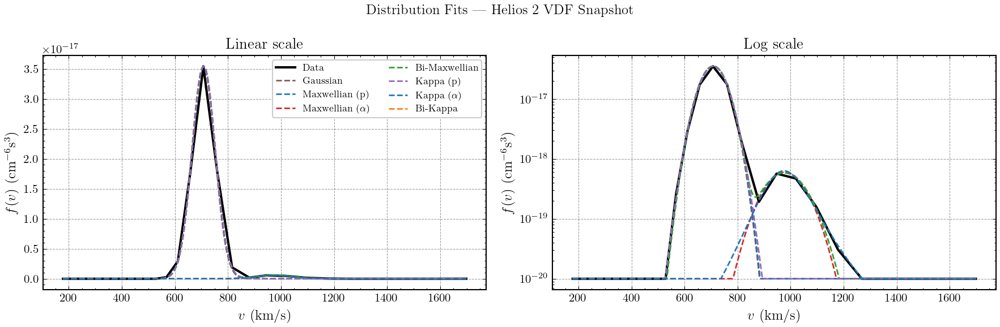

In [30]:
# ── Figure: all distribution fits on linear + log scale ──────────────────────
fits = {}
fits['Gaussian']       = (gaussian,      p_gauss,  'C5')
fits['Maxwellian (p)'] = (maxwellian,    p_max_p,  'C0')
fits['Maxwellian ($\\alpha$)'] = (maxwellian,    p_max_a,  'C1')
fits['Bi-Maxwellian']  = (bimaxwellian,  p_bimax,  'C2')
fits['Kappa (p)']      = (kappa_dist,    p_kap_p,  'C4')
fits['Kappa ($\\alpha$)']      = (kappa_dist,    p_kap_a,  'C6' if len(COLORS)>5 else 'k')
fits['Bi-Kappa']       = (bikappa_dist,  p_bikap,  'C3')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4), sharex=True)

for ax, scale in zip([ax1, ax2], ['linear', 'log']):
    ydata = f_arr if scale == 'linear' else f_arr_clipped
    ax.plot(v_arr, ydata, 'k-', lw=2, label='Data')
    for name, (func, popt, col) in fits.items():
        yf = func(v_smooth, *popt)
        yf_plot = yf if scale == 'linear' else np.clip(yf, 1e-20, None)
        ax.plot(v_smooth, yf_plot, color=col, ls='--', lw=1.3, label=name)
    if scale == 'log':
        ax.set_yscale('log')
    ax.set_xlabel(r'$v$ (km/s)')
    ax.set_ylabel(r'$f(v)$ (cm$^{-6}$s$^3$)')
    ax.set_title(f'{scale.capitalize()} scale')

ax1.legend(fontsize=8, ncol=2)
fig.suptitle('Distribution Fits — Helios 2 VDF Snapshot', fontsize=12)
plt.tight_layout()
plt.savefig('figures/vdf_all_fits.pdf')
plt.show()


## 2.3 Proton & Alpha Moment Calculations

Moments are computed via trapezoid integration of each separated population.
Units are converted to SI internally. Macroscopic quantities follow from the
standard kinetic-theory expressions given in Section 1.


In [31]:
# ── Population separation & unit conversion ───────────────────────────────────
from scipy.integrate import trapezoid

CUT = 22

# Proton population
v_protons   = v_arr[:CUT] * 1e3                    # km/s → m/s
f_protons   = f_arr[:CUT] * 1e30 * 1e12            # cm⁻⁶s³ → m⁻⁶s³

# Alpha population
v_alpha     = v_arr[CUT:] * 1e3
f_alpha     = f_arr[CUT:] * 1e30 * 1e12

def compute_moments(v_m, f_m, mass):
    """Return dict of plasma moments for a single population."""
    n    = trapezoid(f_m, v_m)
    u    = trapezoid(v_m * f_m, v_m) / n
    var  = trapezoid((v_m - u)**2 * f_m, v_m) / n
    sig  = np.sqrt(var)
    P    = mass * trapezoid((v_m - u)**2 * f_m, v_m)
    T_K  = P / (n * kB_val)
    T_eV = T_K * kB_val / e
    skew = trapezoid((v_m - u)**3 * f_m, v_m) / (n * sig**3)
    kurt = trapezoid((v_m - u)**4 * f_m, v_m) / (n * sig**4)
    KE   = 0.5 * mass * trapezoid(v_m**2 * f_m, v_m)
    E_th = 0.5 * mass * trapezoid((v_m - u)**2 * f_m, v_m)
    q    = 0.5 * mass * trapezoid((v_m - u)**3 * f_m, v_m)
    f_s  = np.where(f_m > 0, f_m, 1e-300)
    S    = -kB_val * trapezoid(f_s * np.log(f_s), v_m)
    rho  = mass * n
    cs   = np.sqrt(5/3 * kB_val * T_K / mass)
    return dict(n=n, u=u, sigma=sig, P=P, T_K=T_K, T_eV=T_eV,
                skewness=skew, kurtosis=kurt, KE=KE, E_th=E_th, q=q,
                S=S, S_per_particle=S/n, rho=rho, P_dyn=rho*u**2,
                mach=u/sig, c_s=cs, h=(5/2)*kB_val*T_K/mass)

mom_p = compute_moments(v_protons, f_protons, m_p_val)
mom_a = compute_moments(v_alpha,   f_alpha,   m_alpha)

# Print formatted results
def print_moments(label, m):
    print(f"\n{'='*50}")
    print(f"  {label}")
    print(f"{'='*50}")
    print(f"  n             = {m['n']:.4e}  m⁻³")
    print(f"  u             = {m['u']/1e3:.4e}  km/s")
    print(f"  σ             = {m['sigma']:.4e}  m/s")
    print(f"  P             = {m['P']:.4e}  Pa")
    print(f"  T             = {m['T_K']:.4e}  K  ({m['T_eV']:.4e} eV)")
    print(f"  Skewness      = {m['skewness']:.4f}")
    print(f"  Kurtosis      = {m['kurtosis']:.4f}")
    print(f"  KE            = {m['KE']:.4e}  J")
    print(f"  E_thermal     = {m['E_th']:.4e}  J")
    print(f"  Heat flux q   = {m['q']:.4e}  W/m²")
    print(f"  Entropy S     = {m['S']:.4e}  J/(K·m³)")
    print(f"  S/particle    = {m['S_per_particle']:.4e}  J/K")
    print(f"  Mach (thermal)= {m['mach']:.4f}")
    print(f"  Sound speed   = {m['c_s']:.4e}  m/s")

print_moments('Proton', mom_p)
print_moments('Alpha',  mom_a)

# Ratios
print(f"\n{'='*50}\n  Alpha / Proton Ratios\n{'='*50}")
for key in ['n','u','T_K','P','skewness','kurtosis','KE','E_th','q','S','mach','c_s']:
    if mom_p[key] != 0:
        print(f"  {key:12s}: {mom_a[key]/mom_p[key]:.4f}")



  Proton
  n             = 3.8130e+30  m⁻³
  u             = 7.0746e+02  km/s
  σ             = 4.2273e+04  m/s
  P             = 1.1397e+13  Pa
  T             = 2.1648e+05  K  (1.8655e+01 eV)
  Skewness      = -0.1504
  Kurtosis      = 2.8923
  KE            = 1.6017e+15  J
  E_thermal     = 5.6984e+12  J
  Heat flux q   = -3.6241e+16  W/m²
  Entropy S     = -3.0724e+09  J/(K·m³)
  S/particle    = -8.0577e-22  J/K
  Mach (thermal)= 16.7355
  Sound speed   = 5.4574e+04  m/s

  Alpha
  n             = 9.7155e+28  m⁻³
  u             = 9.9832e+02  km/s
  σ             = 8.0803e+04  m/s
  P             = 4.2440e+12  Pa
  T             = 3.1638e+06  K  (2.7265e+02 eV)
  Skewness      = 3.1953
  Kurtosis      = 26.9831
  KE            = 3.2603e+14  J
  E_thermal     = 2.1220e+12  J
  Heat flux q   = 5.4789e+17  W/m²
  Entropy S     = -7.2831e+07  J/(K·m³)
  S/particle    = -7.4964e-22  J/K
  Mach (thermal)= 12.3549
  Sound speed   = 1.0432e+05  m/s

  Alpha / Proton Ratios
  n           :

<a id="eda"></a>
# 3. Exploratory Data Analysis & Statistics

## 3.1 Dataset Overview

Helios 2 solar wind core proton and magnetic field measurements (1974–1980).

| Quantity | Symbol | Units | Column |
|---------|--------|-------|--------|
| Radial distance | — | AU | `r_sun` |
| Magnetic field components | $B_x, B_y, B_z$ | nT | `Bx, By, Bz` |
| Proton density | $n_p$ | cm⁻³ | `n_p` |
| Parallel proton temperature | $T_{\parallel p}$ | K | `Tp_par` |
| Perpendicular proton temperature | $T_{\perp p}$ | K | `Tp_perp` |
| Proton velocity components | $v_{px}, v_{py}, v_{pz}$ | km/s | `vp_x, vp_y, vp_z` |
| Parallel thermal velocity | $v_{\rm th\parallel}$ | km/s | `vth_p_par` |
| Perpendicular thermal velocity | $v_{\rm th\perp}$ | km/s | `vth_p_perp` |


In [32]:
# Step 4: Load the CSV file 

Helios2 = pd.read_csv("Helios2_solar_wind_data.csv")
Helios2.columns[0:]

Index(['Time', 'B instrument', 'Bx', 'By', 'Bz', 'sigma B', 'Ion instrument',
       'Status', 'Tp_par', 'Tp_perp', 'carrot', 'r_sun', 'clat', 'clong',
       'earth_he_angle', 'n_p', 'vp_x', 'vp_y', 'vp_z', 'vth_p_par',
       'vth_p_perp'],
      dtype='str')

## 3.2 Derived Plasma Quantities

In [33]:
# ── Core derived fields ────────────────────────────────────────────────────────
Helios2['B_r']   = Helios2['Bx']
Helios2['B_tan'] = np.sqrt(Helios2['By']**2 + Helios2['Bz']**2)
Helios2['B']     = np.sqrt(Helios2['Bx']**2 + Helios2['By']**2 + Helios2['Bz']**2)
Helios2['Tp']    = (Helios2['Tp_par'] + 2 * Helios2['Tp_perp']) / 3
Helios2['V_r']   = Helios2['vp_x']
Helios2['V_perp']= np.sqrt(Helios2['vp_y']**2 + Helios2['vp_z']**2)
Helios2['V']     = np.sqrt(Helios2['vp_x']**2 + Helios2['vp_y']**2 + Helios2['vp_z']**2)
Helios2['flux_r']= Helios2['n_p'] * Helios2['V_r'] * Helios2['r_sun']**2
Helios2['S_par'] = Helios2['Tp_par']  / Helios2['n_p']**(2/3)
Helios2['S_perp']= Helios2['Tp_perp'] / (Helios2['n_p'] * Helios2['B'])

# ── SI-unit intermediates ──────────────────────────────────────────────────────
n_p_m3 = Helios2['n_p'] * cm3_to_m3
B_T    = Helios2['B']   * nT_to_T
Tp     = Helios2['Tp']

# ── Plasma beta ────────────────────────────────────────────────────────────────
Helios2['beta_par']  = (mu0 * n_p_m3 * kB_val * Helios2['Tp_par'])  / B_T**2
Helios2['beta_perp'] = (mu0 * n_p_m3 * kB_val * Helios2['Tp_perp']) / B_T**2
Helios2['beta']      = (2 * mu0 * n_p_m3 * kB_val * Tp)             / B_T**2

# ── Wave speeds and Mach numbers ──────────────────────────────────────────────
Helios2['V_A']  = B_T / np.sqrt(mu0 * n_p_m3 * m_p_val)    # Alfvén speed [m/s]
Helios2['M_A']  = Helios2['V_r'] * 1e3 / Helios2['V_A']
Helios2['c_s']  = np.sqrt(gamma_ad * kB_val * Tp / m_p_val)
Helios2['M']    = Helios2['V_r'] * 1e3 / Helios2['c_s']
Helios2['v_th'] = np.sqrt(kB_val * Tp / m_p_val)
Helios2['M_th'] = Helios2['V_r'] * 1e3 / Helios2['v_th']

# ── Pressures and energy densities ────────────────────────────────────────────
Helios2['P_th']      = n_p_m3 * kB_val * Tp
Helios2['P_B']       = B_T**2 / (2 * mu0)
Helios2['P_dyn']     = m_p_val * n_p_m3 * (Helios2['V_r'] * 1e3)**2
Helios2['P_k_par']   = n_p_m3 * kB_val * Helios2['Tp_par']
Helios2['P_k_perp']  = n_p_m3 * kB_val * Helios2['Tp_perp']

# ── Misc ───────────────────────────────────────────────────────────────────────
Helios2['A']       = Helios2['Tp_perp'] / Helios2['Tp_par']          # anisotropy
Helios2['mu_p']    = Helios2['Tp_perp'] / Helios2['B']               # mag moment proxy
Helios2['omega_p'] = (e * Helios2['B'] * nT_to_T) / m_p_val         # gyrofrequency [rad/s]
Helios2['tau']     = 2 * np.pi / Helios2['omega_p']                  # gyroperiod [s]
Helios2['h']       = (5/2) * kB_val * Tp / m_p_val                  # specific enthalpy [J/kg]
Helios2['Q_par']   = kB_val * Helios2['n_p'] * Helios2['Tp_par']  * Helios2['V_r']
Helios2['Q_perp']  = kB_val * Helios2['n_p'] * Helios2['Tp_perp'] * Helios2['V_r']

print(f"Dataset shape: {Helios2.shape}")
Helios2.describe()


Dataset shape: (709527, 52)


,B instrument,Bx,By,Bz,sigma B,Ion instrument,Status,Tp_par,Tp_perp,carrot,...,P_dyn,P_k_par,P_k_perp,A,mu_p,omega_p,tau,h,Q_par,Q_perp
count,709527.000000,589807.000000,589807.000000,589807.000000,589807.000000,709527.000000,709527.000000,5.898070e+05,5.898070e+05,709527.000000,...,5.898070e+05,5.898070e+05,5.898070e+05,589807.000000,589807.000000,589807.000000,589807.000000,5.898070e+05,5.898070e+05,5.898070e+05
mean,0.800849,-1.202863,0.452580,-0.156490,1.497059,1.081554,1.306965,1.054827e+05,1.549573e+05,1665.272576,...,5.697207e-09,4.442333e-11,5.916710e-11,1.371849,10648.801445,1.515389,7.074530,2.857522e+09,1.805356e-14,2.655040e-14
std,0.879535,15.188667,10.345598,8.683275,2.186500,0.273685,0.966234,1.185171e+05,2.058284e+05,14.704161,...,7.384666e-09,3.341771e-10,1.793292e-10,0.967503,10244.736808,1.228687,5.088065,3.388860e+09,1.292884e-13,8.105836e-14
min,-1.000000,-66.823300,-102.463000,-92.884300,0.000000,1.000000,-3.000000,1.603730e+03,1.711720e+03,1639.000000,...,4.019604e-11,2.949549e-14,3.533989e-14,0.001737,98.613315,0.047109,0.465963,1.449663e+08,7.639093e-18,1.405736e-17
25%,1.000000,-6.716875,-4.824240,-3.451000,0.404141,1.000000,1.000000,4.511710e+04,3.852350e+04,1652.000000,...,1.510533e-09,4.358376e-12,4.172417e-12,0.742274,3689.548983,0.661004,3.136611,8.751089e+08,1.698312e-15,1.579014e-15
50%,1.000000,-0.776000,0.523333,-0.100000,0.679404,1.000000,1.000000,7.500520e+04,7.495410e+04,1664.000000,...,2.740035e-09,1.010189e-11,1.066331e-11,1.031596,7109.155669,1.006766,6.240957,1.624375e+09,4.053638e-15,4.316704e-15
75%,1.000000,5.436805,5.541670,3.316850,1.554095,1.000000,1.000000,1.256305e+05,1.789485e+05,1677.000000,...,6.936852e-09,3.745739e-11,5.077728e-11,1.713070,14665.827458,2.003176,9.505517,3.358505e+09,1.521638e-14,1.999769e-14
max,2.000000,100.162000,106.880000,111.441000,43.723100,2.000000,4.000000,8.657200e+06,5.885890e+06,1692.000000,...,3.328055e-07,1.014561e-07,3.383892e-08,71.078696,448531.380139,13.484305,133.374157,8.793261e+10,4.623982e-11,1.210455e-11


## 3.3 Radial Profile Visualisation

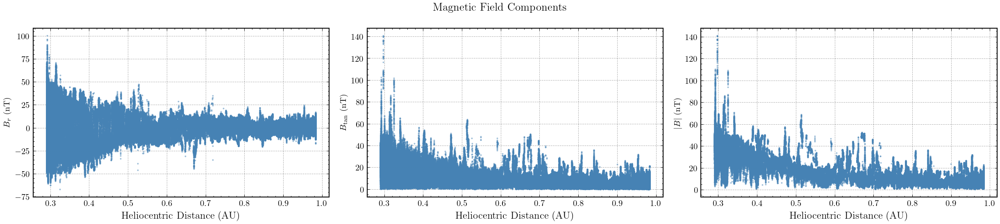

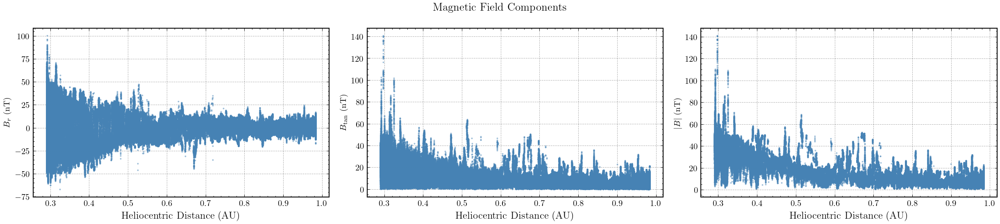

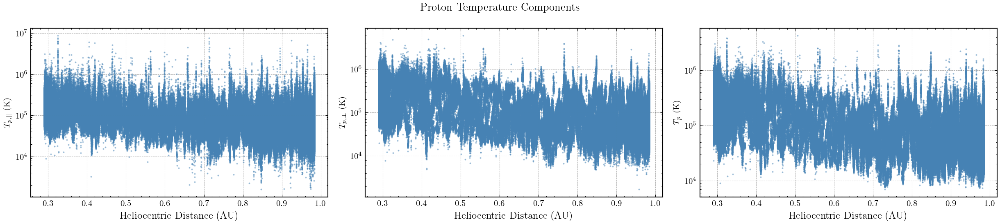

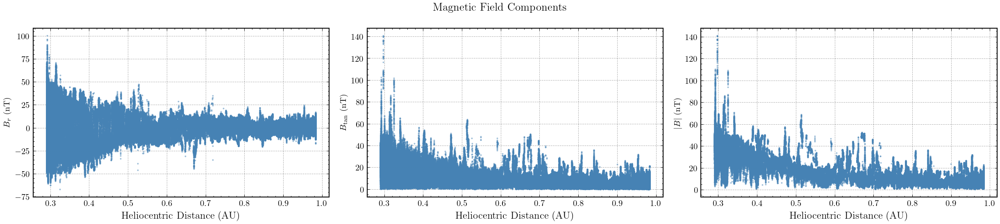

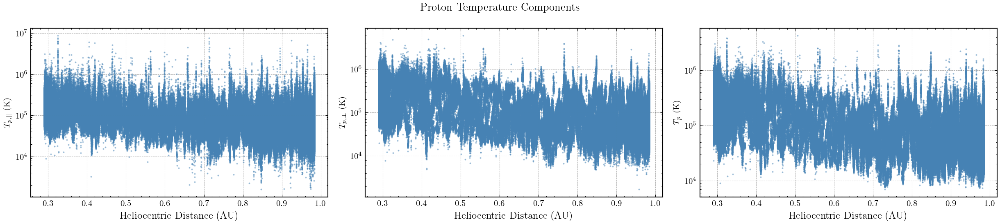

...

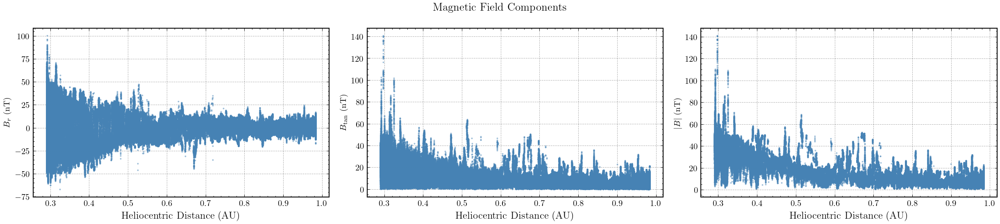

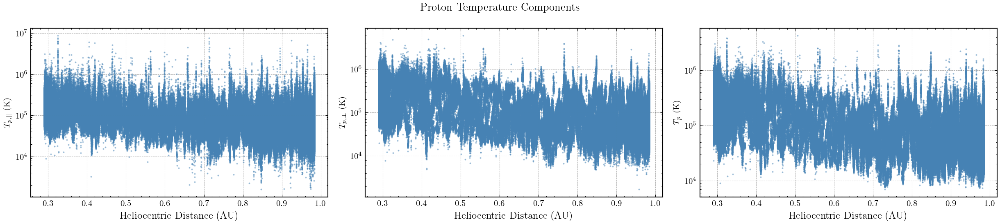

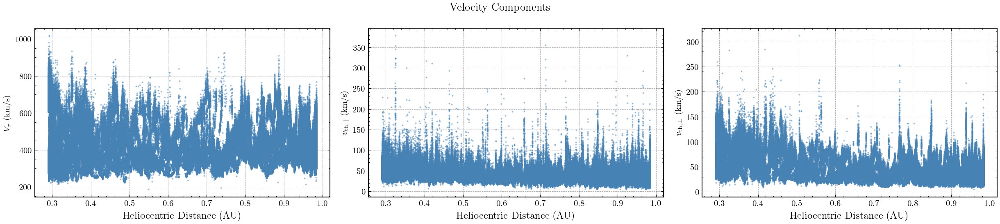

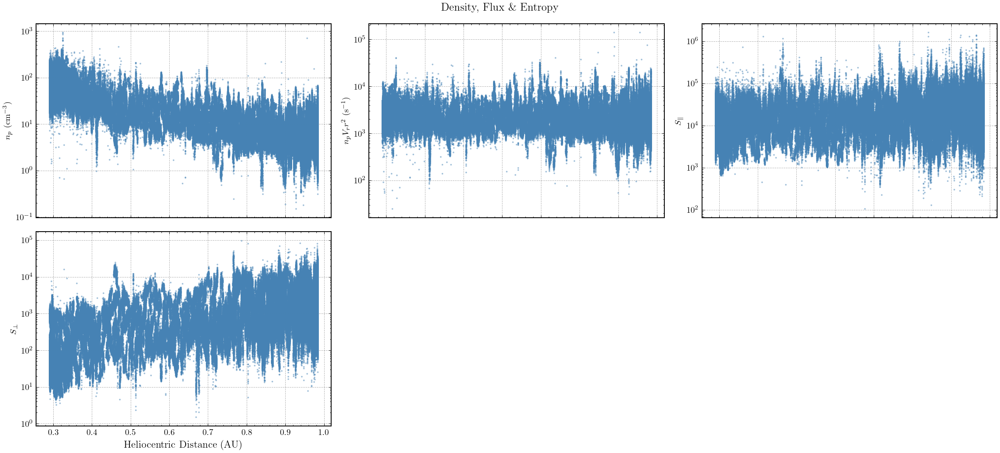

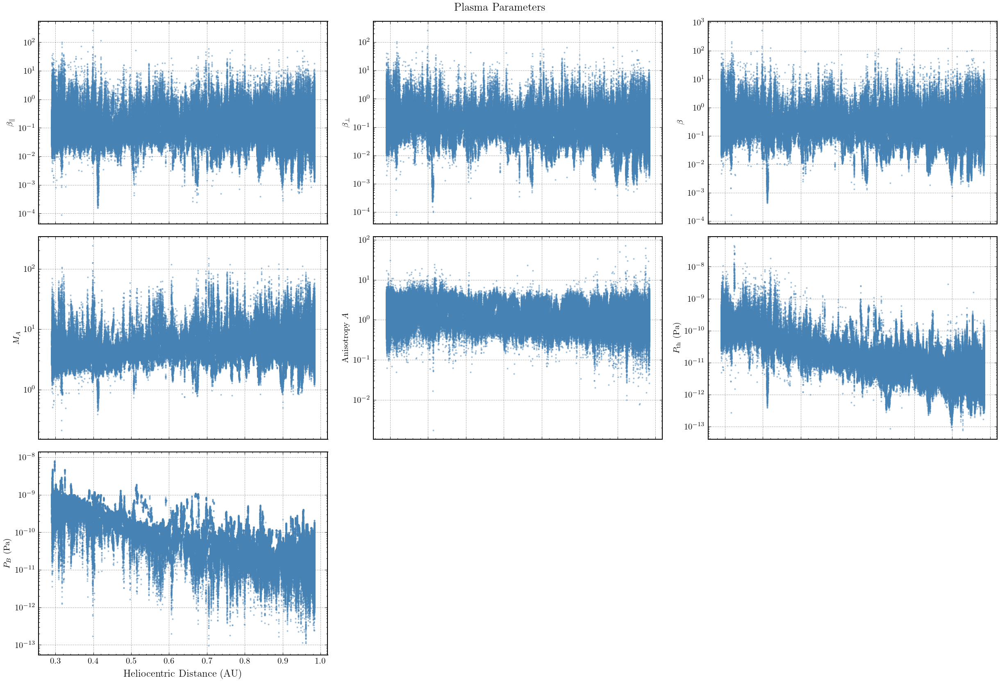

In [36]:
# ── Grouped quantity-label pairs ──────────────────────────────────────────────
magnetic_field = [
    ('B_r',   r'$B_r$ (nT)'),
    ('B_tan', r'$B_\mathrm{tan}$ (nT)'),
    ('B',     r'$|B|$ (nT)'),
]
temperature_fields = [
    ('Tp_par',  r'$T_{p,\parallel}$ (K)'),
    ('Tp_perp', r'$T_{p,\perp}$ (K)'),
    ('Tp',      r'$T_p$ (K)'),
]
velocity_fields = [
    ('V_r',       r'$V_r$ (km/s)'),
    ('vth_p_par', r'$v_{\rm th,\parallel}$ (km/s)'),
    ('vth_p_perp',r'$v_{\rm th,\perp}$ (km/s)'),
]
density_entropy = [
    ('n_p',    r'$n_p$ (cm$^{-3}$)'),
    ('flux_r', r'$n_p V_r r^2$ (s$^{-1}$)'),
    ('S_par',  r'$S_\parallel$'),
    ('S_perp', r'$S_\perp$'),
]
plasma_params = [
    ('beta_par',  r'$\beta_\parallel$'),
    ('beta_perp', r'$\beta_\perp$'),
    ('beta',      r'$\beta$'),
    ('M_A',       r'$M_A$'),
    ('A',         r'Anisotropy $A$'),
    ('P_th',      r'$P_{\rm th}$ (Pa)'),
    ('P_B',       r'$P_B$ (Pa)'),
]

def plot_radial_grid(df, qty_list, title, n_cols=3, log_y=True):
    """Scatter-plot radial profiles in a publication-quality grid."""
    n_rows = int(np.ceil(len(qty_list) / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(5.5*n_cols, 3.8*n_rows),
                            sharex=True, squeeze=False)
    axs = axs.flatten()
    for i, (col, lbl) in enumerate(qty_list):
        ax = axs[i]
        dat = df[['r_sun', col]].dropna()
        if dat.empty:
            ax.axis('off'); continue
        ax.scatter(dat['r_sun'], dat[col], s=1, alpha=0.4, color='steelblue', rasterized=True)
        if log_y and (dat[col] > 0).all():
            ax.set_yscale('log')
        ax.set_ylabel(lbl, fontsize=10)
        ax.grid(alpha=0.3)
    for ax in axs[-n_cols:]:
        if ax.get_visible():
            ax.set_xlabel(r'Heliocentric Distance (AU)')
    for j in range(len(qty_list), len(axs)):
        axs[j].axis('off')
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.savefig(f'figures/radial_{title[:20].replace(" ","_")}.pdf')
    plt.show()

plot_radial_grid(Helios2, magnetic_field,   'Magnetic Field Components',      log_y=False)
plot_radial_grid(Helios2, temperature_fields,'Proton Temperature Components')
plot_radial_grid(Helios2, velocity_fields,   'Velocity Components',           log_y=False)
plot_radial_grid(Helios2, density_entropy,   'Density, Flux \\& Entropy')
plot_radial_grid(Helios2, plasma_params,     'Plasma Parameters')

### 3D Vector Visualisations

In [ ]:
# ── 3-D scatter: magnetic field vector space ──────────────────────────────────
Bx, By, Bz = Helios2['Bx'].values, Helios2['By'].values, Helios2['Bz'].values

fig = plt.figure(figsize=(11, 5))

ax1 = fig.add_subplot(1, 2, 1, projection='3d')
for comp, cmap_name, lab in zip([Bx, By, Bz], ['Reds', 'Greens', 'Blues'],
                                 [r'$B_x$', r'$B_y$', r'$B_z$']):
    sc = ax1.scatter(Bx, By, Bz, c=comp, cmap=cmap_name, s=0.5, alpha=0.3)
ax1.set_xlabel(r'$B_x$ (nT)'); ax1.set_ylabel(r'$B_y$ (nT)'); ax1.set_zlabel(r'$B_z$ (nT)')
ax1.set_title('Magnetic Field Vector Space')
legend_handles = [Line2D([0],[0],color=c,lw=2,label=l)
                  for c,l in zip(['red','green','blue'],[r'$B_x$',r'$B_y$',r'$B_z$'])]
ax1.legend(handles=legend_handles, fontsize=9)

# ── Polar plot: B_r vs B_tan ──────────────────────────────────────────────────
ax2 = fig.add_subplot(1, 2, 2, projection='polar')
B_r_vals   = Helios2['B_r'].values
B_tan_vals = Helios2['B_tan'].values
theta = np.arctan2(B_tan_vals, B_r_vals)
B_mag = np.sqrt(B_r_vals**2 + B_tan_vals**2)
mask  = (theta >= 0) & (theta <= np.pi)
sc2 = ax2.scatter(theta[mask], B_mag[mask], c=B_mag[mask], cmap='plasma', s=0.5, alpha=0.6)
ax2.set_thetamin(0); ax2.set_thetamax(180); ax2.set_rlabel_position(135)
ax2.set_title(r'$B_r$ vs $B_\mathrm{tan}$ (polar)', va='bottom')
fig.colorbar(sc2, ax=ax2, pad=0.12, label='|B| (nT)')

plt.tight_layout()
plt.savefig('figures/magnetic_field_3d_polar.pdf')
plt.show()


In [ ]:
# ── 2-D density scatter: T_par vs T_perp ─────────────────────────────────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4.5))

df_T  = Helios2[['Tp_par',     'Tp_perp'    ]].dropna()
df_th = Helios2[['vth_p_par',  'vth_p_perp' ]].dropna()

for ax, (xd, yd, xl, yl, col) in zip([ax1, ax2], [
        (df_T['Tp_par'],    df_T['Tp_perp'],   r'$T_{p,\parallel}$ (K)',       r'$T_{p,\perp}$ (K)',       'crimson'),
        (df_th['vth_p_par'],df_th['vth_p_perp'],r'$v_{\rm th\parallel}$ (km/s)', r'$v_{\rm th\perp}$ (km/s)', 'indigo')]):
    ax.scatter(xd, yd, s=2, alpha=0.4, color=col, rasterized=True)
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlabel(xl); ax.set_ylabel(yl)

ax1.set_title('Proton Temperature Anisotropy')
ax2.set_title('Proton Thermal Speed Anisotropy')
plt.tight_layout()
plt.savefig('figures/temperature_anisotropy_scatter.pdf')
plt.show()


<a id="radial"></a>
# 4. Poly Curve Fitting, Moving Average & Coefficient Extraction

## 4.1 Moving Average Smoothing

A centred rolling window suppresses turbulent noise and reveals long-term
radial trends. The smoothed value at index $i$ is:

$$
\bar{y}_i = \frac{1}{W}\sum_{j=i-W/2}^{i+W/2} y_j
$$

`center=True` keeps the smoothed series phase-aligned with the raw data.


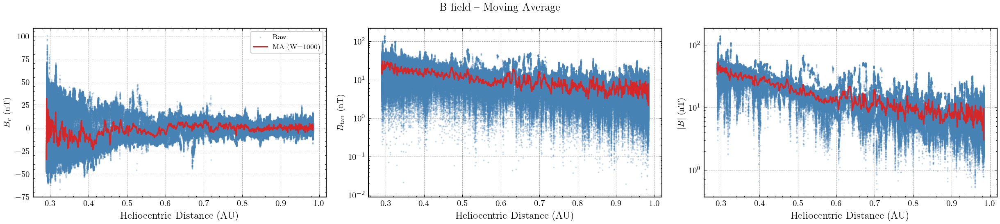

/tmp/ipykernel_23112/2059975479.py:34: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/tmp/ipykernel_23112/2059975479.py:35: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f'figures/MA_{title[:20].replace(" ","_")}.pdf')
/home/salastro/Documents/Internships/25/CTP BUE/SWHA/notebooks/venv/lib/python3.14/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


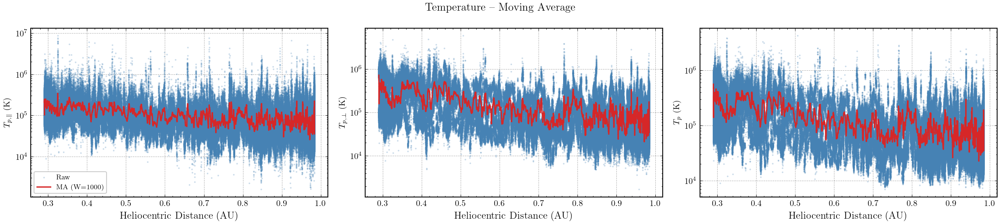

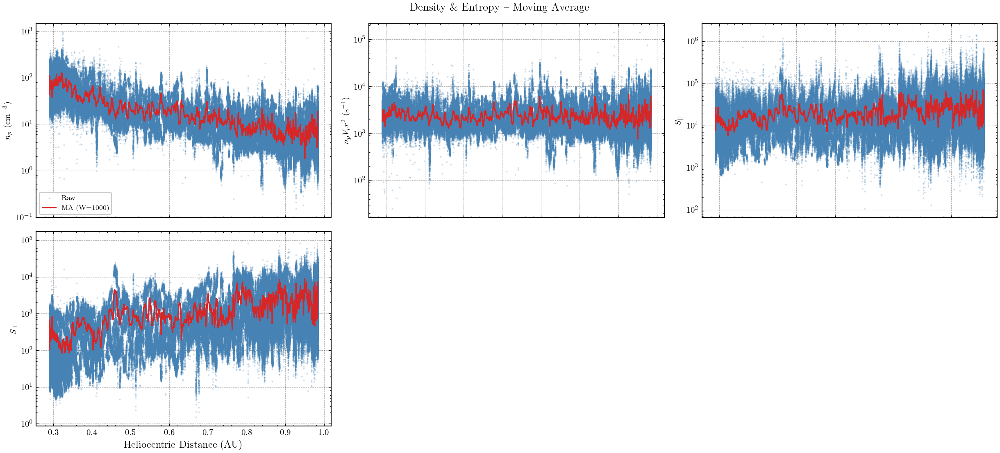

In [ ]:
def plot_with_moving_average(df, qty_list, title, window=1000, n_cols=3):
    n_rows = int(np.ceil(len(qty_list) / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(5.5*n_cols, 3.8*n_rows),
                            sharex=True, squeeze=False)
    axs = axs.flatten()
    for i, (col, lbl) in enumerate(qty_list):
        ax = axs[i]
        dat = df[['r_sun', col]].dropna().sort_values('r_sun').copy()
        if dat.empty:
            ax.axis('off'); continue
        smooth = dat[col].rolling(window=window, center=True).mean()
        dat['smooth'] = smooth
        dat_s = dat.dropna(subset=['smooth'])
        ax.scatter(dat['r_sun'], dat[col], s=1, alpha=0.2, color='steelblue',
                   label='Raw', rasterized=True)
        ax.plot(dat_s['r_sun'], dat_s['smooth'], color='C1', lw=1.5,
                label=f'MA (W={window})')
        if (dat[col] > 0).all():
            ax.set_yscale('log')
        ax.set_ylabel(lbl, fontsize=10)
        ax.grid(alpha=0.3)
        if i == 0:
            ax.legend(fontsize=8)
    for ax in axs[-n_cols:]:
        if ax.get_visible():
            ax.set_xlabel('Heliocentric Distance (AU)')
    for j in range(len(qty_list), len(axs)):
        axs[j].axis('off')
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.savefig(f'figures/MA_{title[:20].replace(" ","_")}.pdf')
    plt.show()

plot_with_moving_average(Helios2, magnetic_field,    'B field – Moving Average')
plot_with_moving_average(Helios2, temperature_fields,'Temperature – Moving Average')
plot_with_moving_average(Helios2, density_entropy,   'Density \\& Entropy – Moving Average')

## 4.2 Radial Power-Law Fits

Each parameter is fitted to the form $Q(r) = A\cdot r^{\alpha}$ by linear
regression in log–log space:

$$
\ln Q = \alpha\ln r + \ln A \quad \Longrightarrow \quad
\text{slope} = \alpha,\quad A = e^{\text{intercept}}
$$

Uncertainties are propagated from the covariance matrix of `np.polyfit`.

### MHD Theoretical Predictions vs Observations

| Plasma Parameter                          | Theory $\alpha$ | Observations (Fitted) $\alpha$ |
| ----------------------------------------- | ----------------------------- | --------------------- |
| Proton Density ($n_p$)                    | $\propto R^{-2.02 \pm 0.05}$  | $\propto R^{-2.07}$   |
| Radial Flux ($n_p V_r$)                   | $\propto R^{-1.99 \pm 0.05}$  | $\propto R^{-0.09}$   |
| Magnetic Field Magnitude ($B$)            | $\propto R^{-1.63 \pm 0.03}$  | $\propto R^{-1.53}$   |
| Radial Magnetic Field ($B_r$)             | $\propto R^{-1.84 \pm 0.05}$  | $\propto R^{-1.87}$   |
| Tangential Magnetic Field ($B_t$)         | $\propto R^{-1.29 \pm 0.06}$  | $\propto R^{-1.21}$   |
| Total Proton Temperature ($T_p$)          | $\propto R^{-0.90 \pm 0.08}$  | $\propto R^{-1.18}$   |
| Parallel Temperature ($T_\parallel$)      | $\propto R^{-0.48 \pm 0.09}$  | $\propto R^{-0.82}$   |
| Perpendicular Temperature ($T_\perp$)     | $\propto R^{-0.99 \pm 0.08}$  | $\propto R^{-1.31}$   |
| Kinetic Pressure ($P_k$)                  | $\propto R^{-2.89 \pm 0.09}$  | $\propto R^{-3.06}$   |
| Magnetic Pressure ($P_B$)                 | $\propto R^{-3.23 \pm 0.07}$  | $\propto R^{-3.25}$   |
| Plasma Beta ($\beta$)                     | $\propto R^{0.40 \pm 0.08}$   | $\propto R^{-0.20}$   |
| Parallel Plasma Beta ($\beta_\parallel$)  | $\propto R^{0.9 \pm 0.1}$     | $\propto R^{0.16}$    |
| Perpendicular Plasma Beta ($\beta_\perp$) | —                             | $\propto R^{-0.33}$   |
| Alfvén Speed ($V_A$)                      | $\propto R^{-0.5}$            | $\propto R^{-0.49}$   |
| Alfvén Mach Number ($M_A$)                | —                             | $\propto R^{0.48}$    |
| Dynamic Pressure ($P_{\rm dyn}$)          | —                             | $\propto R^{-2.10}$   |
| Thermal Speed ($v_{\rm th}$)              | $\propto R^{-0.5}$            | $\propto R^{-0.59}$   |
| Sound Speed ($c_s$)                       | —                             | $\propto R^{-0.59}$   |
| Thermal Mach Number ($M_{\rm th}$)        | —                             | $\propto R^{0.58}$    |
| Specific Enthalpy ($h$)                   | —                             | $\propto R^{-1.18}$   |
| Magnetic Moment Proxy ($\mu_p$)           | —                             | $\propto R^{0.21}$    |
| Parallel Entropy ($S_\parallel$)          | —                             | $\propto R^{0.56}$    |
| Perpendicular Entropy ($S_\perp$)         | —                             | $\propto R^{2.29}$    |
| Perpendicular Heating Rate ($Q_\perp$)    | $\propto R^{-1.83}$           | $\propto R^{-3.40}$   |
| Parallel Heating Rate ($Q_\parallel$)     | $\propto R^{-1.54}$           | $\propto R^{-2.91}$   |
| Gyrofrequency ($\omega_c$)                | —                             | $\propto R^{-1.53}$   |
| Anisotropy ($A$)                          | —                             | $\propto R^{-0.49}$   |


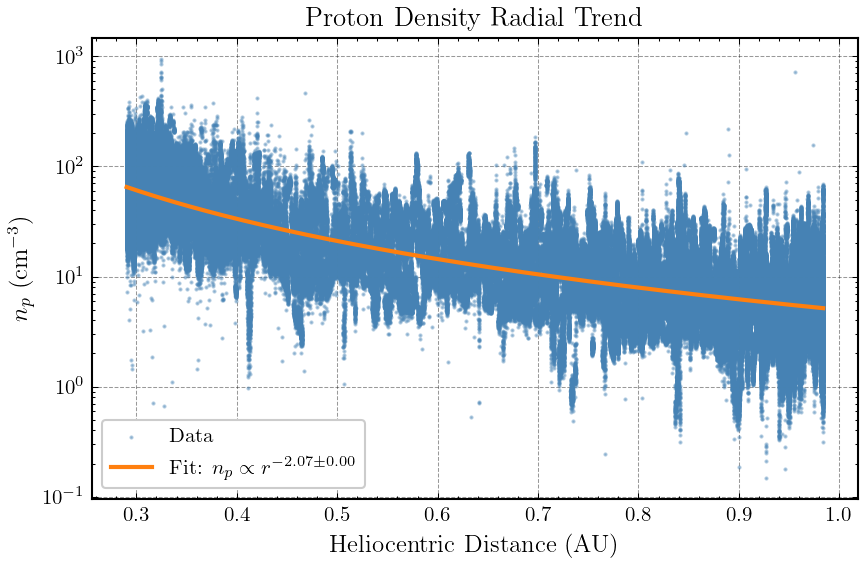

alpha = -2.075 ± 0.002,  A = 4.989 cm⁻³ at 1 AU


In [61]:
# ── Power-law fit for a single quantity (density as example) ─────────────────
df_n = Helios2[['r_sun','n_p']].dropna()
df_n = df_n[(df_n['r_sun'] > 0) & (df_n['n_p'] > 0)].sort_values('r_sun')

log_r = np.log(df_n['r_sun'])
log_n = np.log(df_n['n_p'])
coeffs, cov = np.polyfit(log_r, log_n, deg=1, cov=True)
alpha_n, log_A = coeffs
A_n   = np.exp(log_A)
sigma_alpha = np.sqrt(cov[0, 0])

R_fit = np.linspace(df_n['r_sun'].min(), df_n['r_sun'].max(), 300)
n_fit = A_n * R_fit**alpha_n

fig, ax = plt.subplots(figsize=(6, 4))
ax.scatter(df_n['r_sun'], df_n['n_p'], s=1, alpha=0.4, color='steelblue',
           label='Data', rasterized=True)
ax.plot(R_fit, n_fit, color='C3', lw=2,
        label=rf'Fit: $n_p\propto r^{{{alpha_n:.2f}\pm{sigma_alpha:.2f}}}$')
ax.set_yscale('log')
ax.set_xlabel('Heliocentric Distance (AU)')
ax.set_ylabel(r'$n_p$ (cm$^{-3}$)')
ax.set_title('Proton Density Radial Trend')
ax.legend()
plt.tight_layout()
plt.savefig('figures/radial_fit_np.pdf')
plt.show()
print(f"alpha = {alpha_n:.3f} ± {sigma_alpha:.3f},  A = {A_n:.3f} cm⁻³ at 1 AU")


In [59]:
# ── Generalised radial trend plotter with power-law annotation ────────────────
def plot_radial_trends_with_fit(df, qty_list, title, degree=1, n_cols=3):
    n_rows = int(np.ceil(len(qty_list) / n_cols))
    fig, axs = plt.subplots(
        n_rows, n_cols,
        figsize=(5.5 * n_cols, 3.8 * n_rows),
        sharex=True,
        squeeze=False
    )
    axs = axs.flatten()

    for i, (col, lbl) in enumerate(qty_list):
        ax = axs[i]

        dat = df[['r_sun', col]].dropna()
        dat = dat[(dat['r_sun'] > 0) & (dat[col] > 0)].sort_values('r_sun')

        if dat.empty:
            ax.axis('off')
            continue

        x = dat['r_sun'].values
        y = dat[col].values

        ax.scatter(
            x, y,
            s=1,
            alpha=0.3,
            color='steelblue',
            rasterized=True
        )

        # log-log linear fit
        coeffs, cov = np.polyfit(np.log(x), np.log(y), deg=degree, cov=True)

        alpha = coeffs[0]
        intercept = coeffs[1]

        alpha_err = np.sqrt(cov[0, 0])

        A = np.exp(intercept)

        R = np.linspace(x.min(), x.max(), 300)

        fit = A * R**alpha

        # confidence band (±1σ on exponent)
        fit_upper = A * R**(alpha + alpha_err)
        fit_lower = A * R**(alpha - alpha_err)

        ax.fill_between(
            R,
            fit_lower,
            fit_upper,
            color='C3',
            alpha=0.25,
            linewidth=0
        )

        ax.plot(
            R,
            fit,
            color='C3',
            lw=1.8,
            label=rf'$\propto r^{{{alpha:.2f} \pm {alpha_err:.3f}}}$'
        )

        ax.annotate(
            rf'$\alpha = {alpha:.2f} \pm {alpha_err:.3f}$',
            xy=(0.97, 0.94),
            xycoords='axes fraction',
            ha='right',
            va='top',
            fontsize=9,
            bbox=dict(fc='white', ec='none', alpha=0.7)
        )

        ax.set_yscale('log')
        # ax.set_xscale('log')
        ax.set_ylabel(lbl, fontsize=10)
        # ax.grid(alpha=0.3, which='both')
        ax.grid(alpha=0.3)

    for ax in axs[-n_cols:]:
        if ax.get_visible():
            ax.set_xlabel('Heliocentric Distance (AU)')

    for j in range(len(qty_list), len(axs)):
        axs[j].axis('off')

    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.savefig(f'figures/powerlaw_{title[:20].replace(" ", "_")}.pdf')
    plt.show()

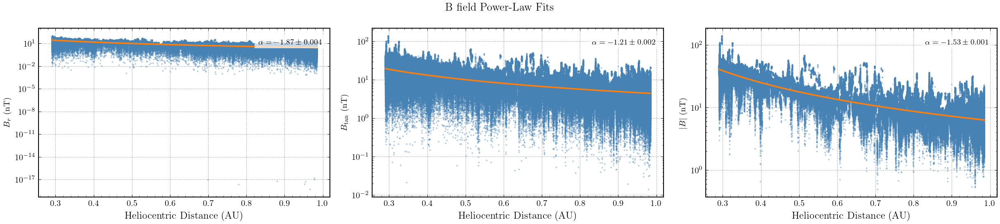

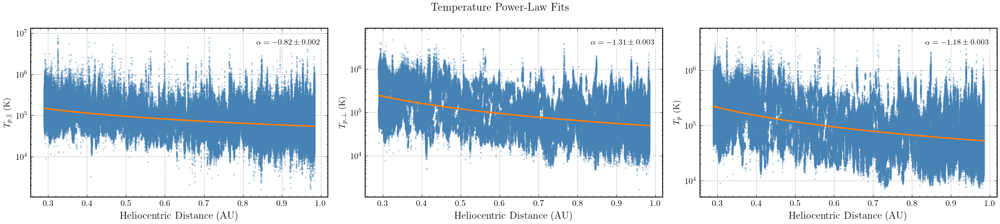

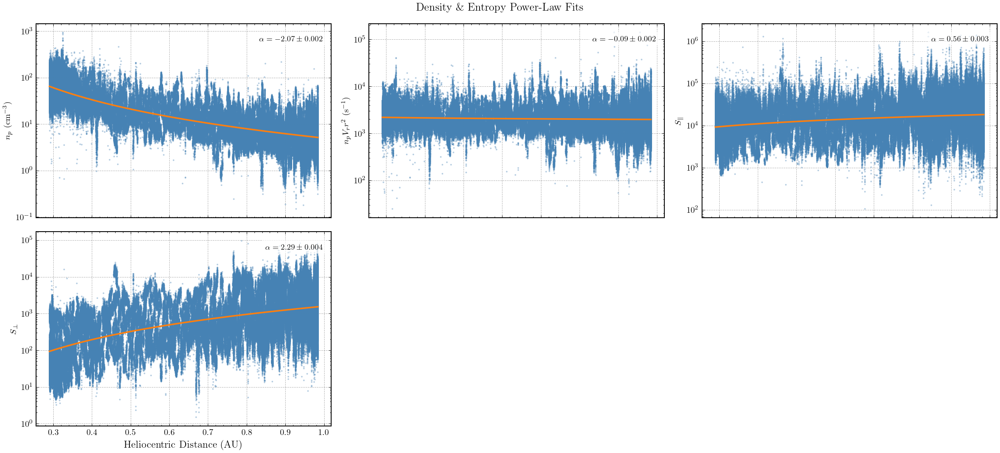

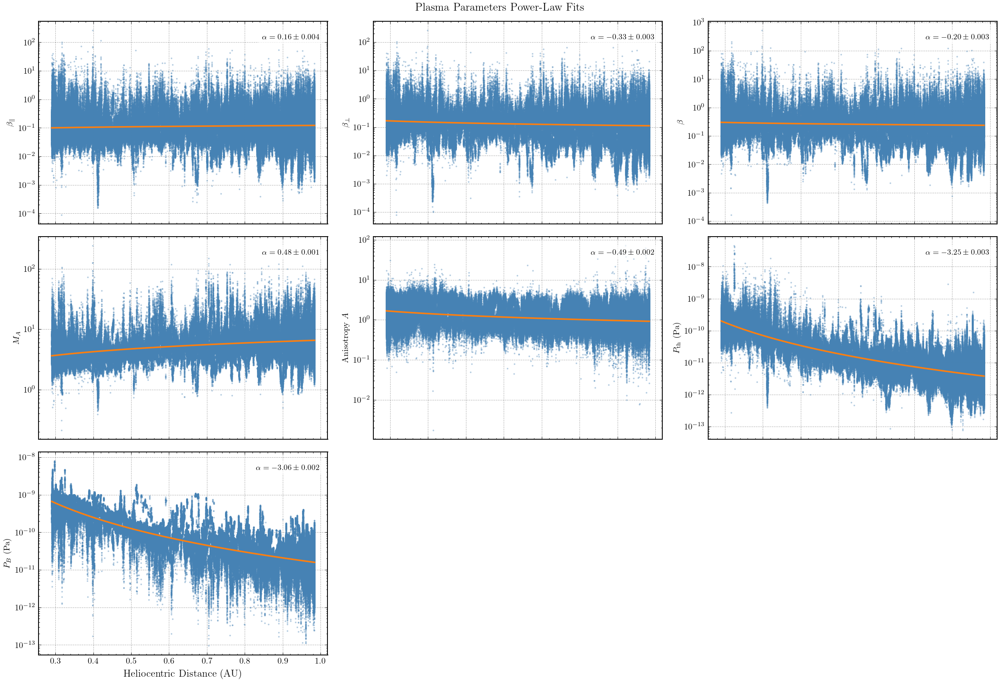

In [60]:

plot_radial_trends_with_fit(Helios2, magnetic_field,    'B field Power-Law Fits')
plot_radial_trends_with_fit(Helios2, temperature_fields,'Temperature Power-Law Fits')
plot_radial_trends_with_fit(Helios2, density_entropy,   'Density \\& Entropy Power-Law Fits')
plot_radial_trends_with_fit(Helios2, plasma_params,     'Plasma Parameters Power-Law Fits')


## 4.3 Power-Law Coefficient Summary

In [47]:
# ── Extract power-law exponents for all numeric columns ──────────────────────
def compute_all_power_laws(df, radius_col='r_sun'):
    numeric_cols = df.select_dtypes(include=['float64','int64']).columns
    cols = [c for c in numeric_cols if c != radius_col]
    rows = []
    for col in cols:
        dat = df[[radius_col, col]].dropna()
        dat = dat[(dat[radius_col] > 0) & (dat[col] > 0)]
        if len(dat) < 3:
            continue
        try:
            coeffs, cov = np.polyfit(np.log(dat[radius_col]), np.log(dat[col]),
                                     deg=1, cov=True)
            rows.append({'quantity': col,
                         'alpha':    round(coeffs[0], 4),
                         'A':        round(np.exp(coeffs[1]), 4),
                         'sigma_alpha': round(np.sqrt(cov[0,0]), 4)})
        except Exception:
            pass
    return pd.DataFrame(rows).set_index('quantity').sort_values('alpha')

power_law_df = compute_all_power_laws(Helios2)
print(power_law_df.to_string())


                 alpha             A  sigma_alpha
quantity                                         
Q_perp         -3.4001  0.000000e+00       0.0031
P_k_perp       -3.3899  0.000000e+00       0.0028
P_th           -3.2549  0.000000e+00       0.0026
P_B            -3.0598  0.000000e+00       0.0024
Q_par          -2.9098  0.000000e+00       0.0028
P_k_par        -2.8996  0.000000e+00       0.0027
P_dyn          -2.0953  0.000000e+00       0.0018
n_p            -2.0750  4.988700e+00       0.0021
clat           -1.9708  5.376000e-01       0.0053
Bx             -1.8728  2.611500e+00       0.0044
B_r            -1.8728  2.611500e+00       0.0044
sigma B        -1.5857  4.196000e-01       0.0027
omega_p        -1.5299  5.899000e-01       0.0012
B              -1.5299  6.158700e+00       0.0012
Tp_perp        -1.3150  4.877620e+04       0.0028
Bz             -1.2539  1.709100e+00       0.0057
B_tan          -1.2135  4.363200e+00       0.0021
By             -1.1870  2.683200e+00       0.0047


<a id="anisotropy"></a>
# 5. Anisotropy & Directional Dependence

Plasma anisotropy is characterised by the ratio $A = T_\perp / T_\parallel$.
Departures from $A=1$ indicate non-equilibrium states that may drive kinetic
instabilities:

- **$A > 1$** (mirror instability regime): $T_\perp > T_\parallel$
- **$A < 1$** (firehose instability regime): $T_\parallel > T_\perp$


/tmp/ipykernel_23112/1489562018.py:45: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('figures/anisotropy_parallel_vs_perp.pdf')
/home/salastro/Documents/Internships/25/CTP BUE/SWHA/notebooks/venv/lib/python3.14/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


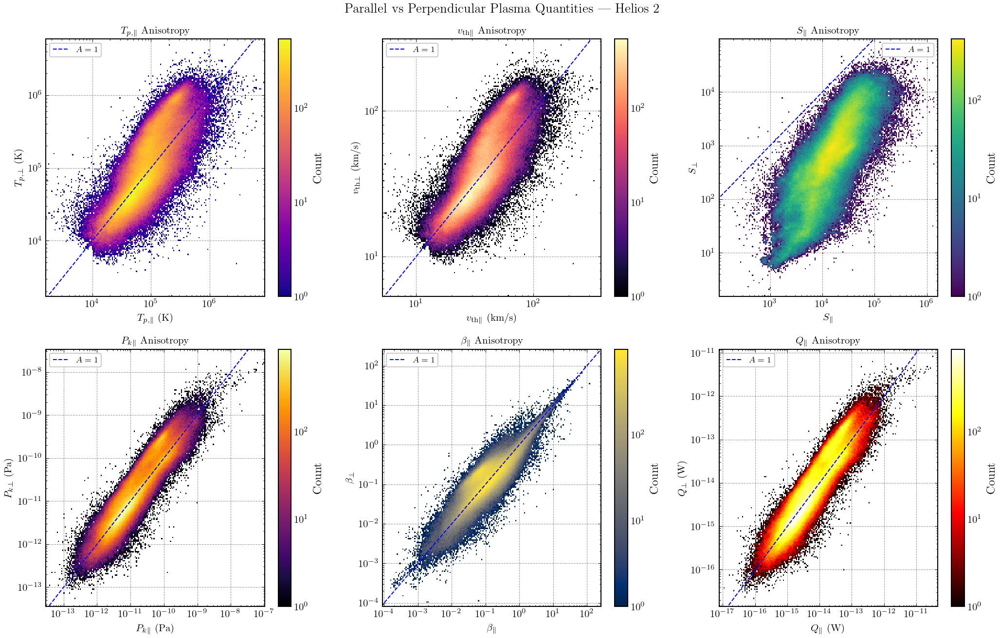

In [64]:
# ── Parallel vs perpendicular quantity pairs ──────────────────────────────────
import matplotlib.colors

aniso_pairs = [
    ('Tp_par',    'Tp_perp',    r'$T_{p,\parallel}$ (K)',      r'$T_{p,\perp}$ (K)',       'plasma'),
    ('vth_p_par', 'vth_p_perp', r'$v_{\rm th\parallel}$ (km/s)', r'$v_{\rm th\perp}$ (km/s)', 'magma'),
    ('S_par',     'S_perp',     r'$S_\parallel$',               r'$S_\perp$',               'viridis'),
    ('P_k_par',   'P_k_perp',   r'$P_{k\parallel}$ (Pa)',       r'$P_{k\perp}$ (Pa)',        'inferno'),
    ('beta_par',  'beta_perp',  r'$\beta_\parallel$',          r'$\beta_\perp$',           'cividis'),
    ('Q_par',     'Q_perp',     r'$Q_\parallel$ (W)',           r'$Q_\perp$ (W)',            'hot'),
]

n_pairs = len(aniso_pairs)
fig, axs = plt.subplots(2, 3, figsize=(14, 9))
axs = axs.flatten()

for i, (xkey, ykey, xlabel, ylabel, cmap_name) in enumerate(aniso_pairs):
    ax = axs[i]
    dat = Helios2[[xkey, ykey]].dropna()
    x_, y_ = dat[xkey], dat[ykey]
    pos = (x_ > 0) & (y_ > 0)
    if pos.sum() < 10:
        ax.axis('off'); continue

    x_p, y_p = x_[pos], y_[pos]
    x_bins = np.logspace(np.log10(x_p.min()), np.log10(x_p.max()), 200)
    y_bins = np.logspace(np.log10(y_p.min()), np.log10(y_p.max()), 200)

    h = ax.hist2d(x_p, y_p, bins=[x_bins, y_bins], cmap=cmap_name,
                  norm=matplotlib.colors.LogNorm())
    ax.set_xscale('log'); ax.set_yscale('log')

    # Isotropy line
    lim = [min(x_p.min(), y_p.min()), max(x_p.max(), y_p.max())]
    ax.plot(lim, lim, 'b--', lw=1, alpha=1, label='$A=1$')

    ax.set_xlabel(xlabel, fontsize=10)
    ax.set_ylabel(ylabel, fontsize=10)
    ax.set_title(f'{xlabel.split("(")[0].strip()} Anisotropy', fontsize=10)
    plt.colorbar(h[3], ax=ax, label='Count')
    ax.legend(fontsize=8)

fig.suptitle('Parallel vs Perpendicular Plasma Quantities — Helios 2', fontsize=13)
plt.tight_layout()
plt.savefig('figures/anisotropy_parallel_vs_perp.pdf')
plt.show()


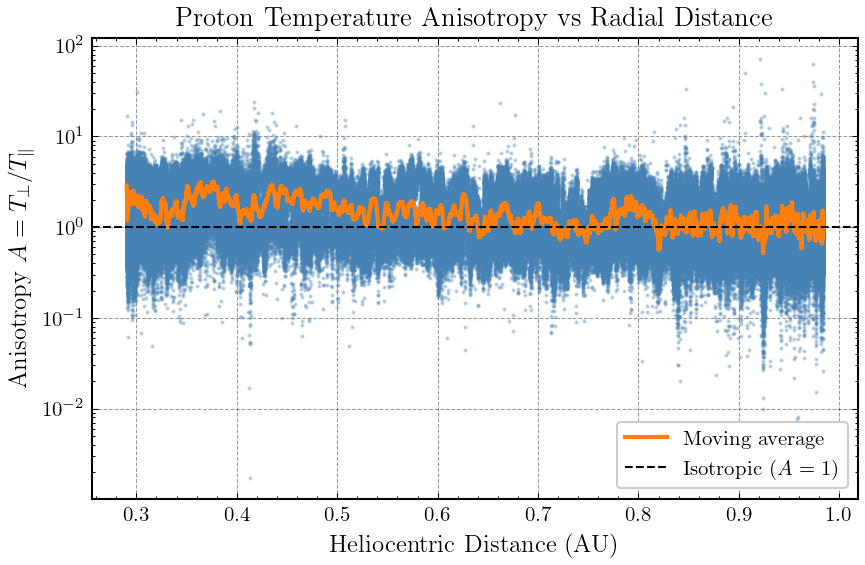

In [54]:
# ── Anisotropy A = T_perp/T_par vs radial distance ───────────────────────────
fig, ax = plt.subplots(figsize=(6, 4))
dat_A = Helios2[['r_sun','A']].dropna()
ax.scatter(dat_A['r_sun'], dat_A['A'], s=1, alpha=0.3, color='steelblue', rasterized=True)

# Smoothed trend
dat_s = dat_A.sort_values('r_sun').copy()
dat_s['A_smooth'] = dat_s['A'].rolling(window=1000, center=True).mean()
dat_s = dat_s.dropna()
ax.plot(dat_s['r_sun'], dat_s['A_smooth'], color='C3', lw=2, label='Moving average')
ax.axhline(1, color='k', ls='--', lw=1, label='Isotropic ($A=1$)')

ax.set_yscale('log')
ax.set_xlabel('Heliocentric Distance (AU)')
ax.set_ylabel(r'Anisotropy $A = T_\perp / T_\parallel$')
ax.set_title('Proton Temperature Anisotropy vs Radial Distance')
ax.legend()
plt.tight_layout()
plt.savefig('figures/anisotropy_vs_r.pdf')
plt.show()


<a id="parker"></a>
# 6. Parker Spiral

## Background

Parker (1958) showed that the solar wind is an isothermal, spherically symmetric
outflow governed by:

$$
\frac{du}{dr} = \left(\frac{4kT}{mr} - \frac{GM}{r^2}\right)u\left(u^2 - \frac{2kT}{m}\right)^{-1}
$$

In dimensionless form ($v=u/c_s$, $R=r/r_c$, $c_s^2 = 2kT/m$, $r_c = GM/(2c_s^2)$):

$$
\frac{dv}{dR} = \frac{2(1/R - 1/R^2)}{v - 1/v}
$$

The azimuthal winding of the interplanetary magnetic field — the **Parker spiral**
— arises from solar rotation $\Omega_\odot$:

$$
\frac{d\psi}{dR} = -\frac{\omega}{v(R)}
$$

where $\omega = \Omega_\odot\,r_c/c_s$ is the dimensionless rotation rate.


In [50]:
# ── Compute Parker spiral angle from observations ─────────────────────────────
def compute_parker_spiral(df):
    dat = df[['r_sun','V_r']].dropna().sort_values('r_sun').reset_index(drop=True)
    R_m = dat['r_sun'].values * AU          # m
    v   = dat['V_r'].values  * 1e3         # m/s

    psi = [0.0]
    for i in range(len(R_m) - 1):
        dR   = R_m[i+1] - R_m[i]
        dpsi = -OMEGA_SUN * dR / v[i] if v[i] != 0 else 0.0
        psi.append(psi[-1] + dpsi)
    return dat, np.array(psi)

df_sp, psi = compute_parker_spiral(Helios2)
df_sp['B_r']   = Helios2.loc[df_sp.index, 'B_r'].values
df_sp['B_tan'] = Helios2.loc[df_sp.index, 'B_tan'].values


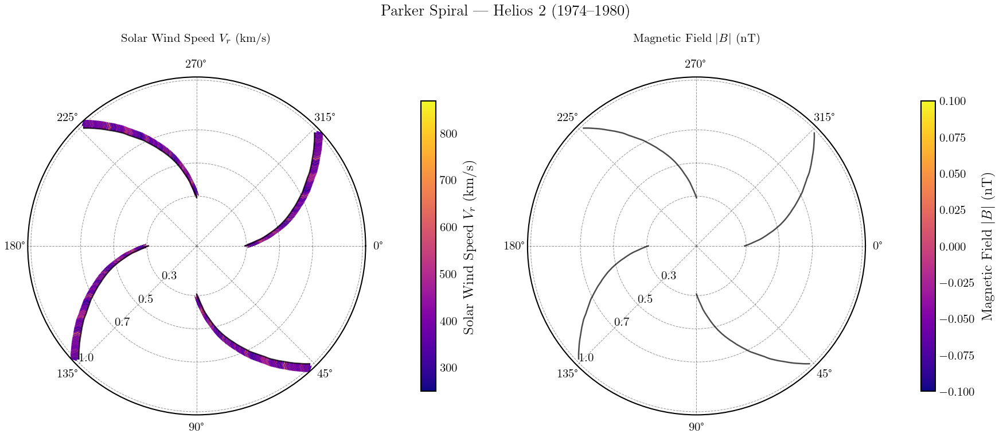

In [51]:
# ── Static Parker spiral — publication figure ─────────────────────────────────
skip = 1000
idx  = np.arange(0, len(df_sp), skip)
r_sub = df_sp['r_sun'].values[idx]
psi_sub = psi[idx]

B_mag = np.sqrt(df_sp['B_r'].values**2 + df_sp['B_tan'].values**2)

fig, axs = plt.subplots(1, 2, figsize=(12, 5.5), subplot_kw={'projection': 'polar'})

for ax, color_col, cbar_lbl in zip(axs,
        [df_sp['V_r'].values, B_mag],
        ['Solar Wind Speed $V_r$ (km/s)', r'Magnetic Field $|B|$ (nT)']):

    c_vals = color_col[idx]
    norm   = plt.Normalize(c_vals.min(), c_vals.max())
    colors = plt.cm.plasma(norm(c_vals))

    arrow_angle  = psi_sub + np.pi / 2
    arrow_length = 0.05
    u_arr = arrow_length * np.cos(arrow_angle)
    v_arr_ = arrow_length * np.sin(arrow_angle)

    for i in range(4):
        rot = i * np.pi / 2
        ax.plot(psi + rot, df_sp['r_sun'].values, 'k-', lw=1.2, alpha=0.7)
        ax.quiver(psi_sub + rot, r_sub, u_arr, v_arr_,
                  color=colors, angles='xy', scale_units='xy', scale=1,
                  width=0.003, headwidth=4, headlength=6)

    ax.set_theta_direction(-1)
    ax.set_theta_zero_location('E')
    ax.set_rlabel_position(135)
    ax.set_rticks([0.3, 0.5, 0.7, 1.0])
    ax.set_title(cbar_lbl, fontsize=10, pad=15)

    sm = plt.cm.ScalarMappable(norm=norm, cmap='plasma'); sm.set_array([])
    fig.colorbar(sm, ax=ax, pad=0.12, label=cbar_lbl, shrink=0.7)

fig.suptitle('Parker Spiral — Helios 2 (1974–1980)', fontsize=13)
plt.tight_layout()
plt.savefig('figures/parker_spiral.pdf')
plt.show()


In [52]:
# ── Animated Parker spiral (saved as GIF) ─────────────────────────────────────
fig_anim, ax_anim = plt.subplots(figsize=(6, 6), subplot_kw={'projection': 'polar'})

color_vals_anim = df_sp['V_r'].values[idx]
norm_anim  = plt.Normalize(color_vals_anim.min(), color_vals_anim.max())
colors_anim = plt.cm.viridis(norm_anim(color_vals_anim))
arrow_angle  = psi_sub + np.pi / 2
u_anim = 0.05 * np.cos(arrow_angle)
v_anim = 0.05 * np.sin(arrow_angle)

arms = [psi_sub + i * np.pi/2 for i in range(4)]

sm_anim = plt.cm.ScalarMappable(norm=norm_anim, cmap='viridis'); sm_anim.set_array([])
plt.colorbar(sm_anim, ax=ax_anim, pad=0.1, label=r'$V_r$ (km/s)')

def update(frame):
    ax_anim.clear()
    ax_anim.set_theta_direction(1); ax_anim.set_theta_zero_location('E')
    ax_anim.set_rlabel_position(135); ax_anim.set_rticks([0.3, 0.5, 0.7, 1.0])
    ax_anim.set_title(r'Parker Spiral — coloured by $V_r$', fontsize=12)
    rot = frame * np.pi / 60
    for i in range(4):
        ax_anim.plot(arms[i] + rot, r_sub, color='k', lw=1.3)
        ax_anim.quiver(arms[i] + rot, r_sub, u_anim, v_anim,
                       color=colors_anim, angles='xy', scale_units='xy', scale=1,
                       width=0.004, headwidth=5)

ani = FuncAnimation(fig_anim, update, frames=120, interval=200)
ani.save('parker_spiral_Vr.gif', writer=PillowWriter(fps=10))
plt.close()
print('Animation saved: parker_spiral_Vr.gif')


Animation saved: parker_spiral_Vr.gif


<a id="discussion"></a>
# 7. Discussion & References

## Discussion Questions

1. How do solar wind parameters change with radial distance? Do observations
   agree with MHD scaling laws?
2. Does temperature decrease as a power law? Compare $T_\parallel$ and
   $T_\perp$ with CGL (adiabatic double-adiabatic) predictions.
3. Is the radial velocity $V_r$ approximately constant with distance?
4. Where does magnetic pressure $P_B$ dominate over thermal pressure $P_\text{th}$?
   How does the plasma $\beta$ evolve?
5. What does the anisotropy profile tell us about wave–particle interactions
   or kinetic heating in the inner heliosphere?
6. Does the observed Parker spiral geometry match the theoretical winding angle
   for the measured solar wind speed?

---

## References

[1] D. Perrone, D. Stansby, T. S. Horbury, and L. Matteini, "Radial evolution
of the solar wind in pure high-speed streams: HELIOS revised observations,"
*MNRAS*, 483(3), 3730–3737, 2018.
https://doi.org/10.1093/mnras/sty3348

[2] D. Stansby, D. Perrone, L. Matteini, T. S. Horbury, and C. S. Salem,
"Alpha particle thermodynamics in the inner heliosphere fast solar wind,"
*A&A*, 623, L2, 2019.
https://doi.org/10.1051/0004-6361/201834900

[3] D. Stansby, C. Salem, L. Matteini, and T. Horbury, "A New Inner Heliosphere
Proton Parameter Dataset from the Helios Mission,"
*Solar Physics*, 293(11), 2018.
https://doi.org/10.1007/s11207-018-1377-3

[4] Q. Chang et al., "Multiple-point Modeling the Parker Spiral Configuration of
the Solar Wind Magnetic Field at Solar Maximum,"
*ApJ*, 884(2), 102, 2019.
https://doi.org/10.3847/1538-4357/ab412a

[5] E. N. Parker, "Dynamics of the Interplanetary Gas and Magnetic Fields,"
*ApJ*, 128, 664, 1958.
https://doi.org/10.1086/146579

[6] E. Villegas-Pulgarin, "The Parker Spiral with Python," *Cosmoscalibur*,
2024.
https://www.cosmoscalibur.com/en/blog/2024/espiral-de-parker-con-python/
